#                      DETECTING EMPTY SLOTS FOR PARKING

IMPORTING NECESSARY LIBRARIES


In [1]:
from __future__ import division
import matplotlib.pyplot as plt
import cv2
import os, glob
import numpy as np
import pandas
cwd = os.getcwd()

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
def show_images(images, cmap=None):
    cols = 2
    rows = (len(images)+1)//cols
    
    plt.figure(figsize=(15, 12))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

UPLOADING IMAGES

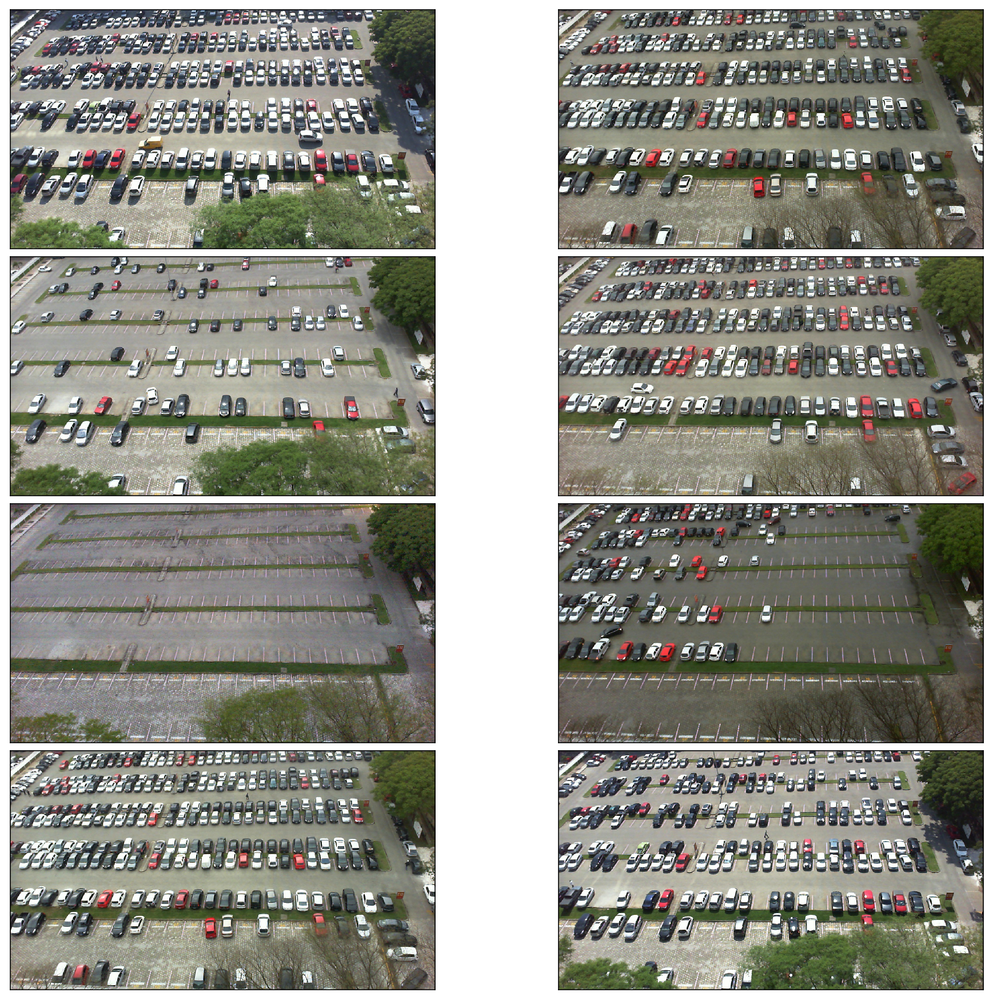

In [3]:
parking_lot = [plt.imread(path) for path in glob.glob('parking_lot/*.jpg')]


show_images(parking_lot)

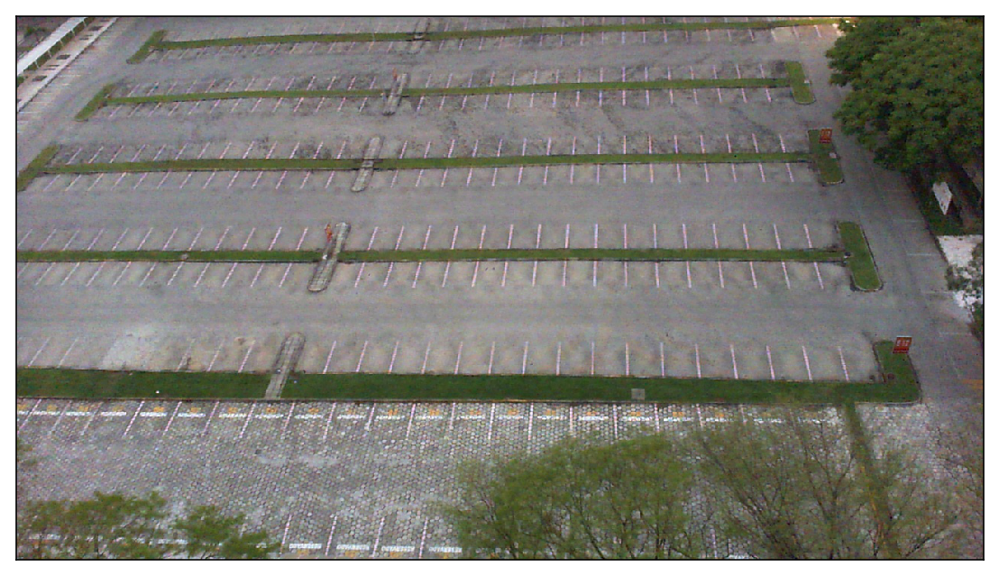

In [4]:
test = [plt.imread(path) for path in glob.glob('test.jpg')]

show_images(test)

In [5]:
final_spot_dict = pandas.read_pickle('final.pickle')

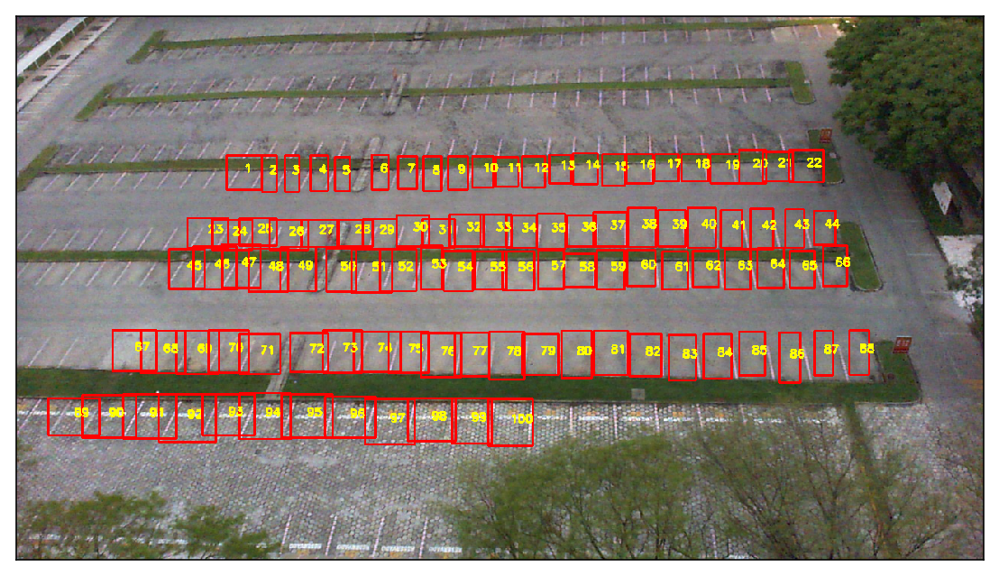

In [6]:
data = []
def assign_spots_map(image, spot_dict=final_spot_dict, make_copy = True, color=[255, 0, 0], thickness=2):
    if make_copy:
        new_image = np.copy(image)
    for spot in spot_dict.keys():
        (x1, y1, x2, y2) = spot
        cv2.rectangle(new_image, (int(x1),int(y1)), (int(x2),int(y2)), color, thickness)
        data = str(spot_dict[spot])
        if(y1<y2):
            cv2.putText(new_image, data, (int((abs(x2-x1))/2)+x1,int((abs(y2-y1))/2)+y1),
            cv2.FONT_HERSHEY_SIMPLEX,0.5, (255,255,0), 2)
        else:
            cv2.putText(new_image, data, (int((abs(x2-x1))/2)+x1,int((abs(y2-y1))/2)+y2),
            cv2.FONT_HERSHEY_SIMPLEX,0.5, (255,255,0), 2)
            
    return new_image

marked_spot_images = list(map(assign_spots_map, test))
show_images(marked_spot_images)

In [7]:
final_spot_dict

{(42, 555, 110, 506): 89,
 (87, 558, 158, 502): 90,
 (127, 470, 185, 416): 67,
 (141, 559, 211, 501): 91,
 (165, 473, 223, 417): 68,
 (188, 564, 264, 501): 92,
 (202, 361, 249, 309): 45,
 (211, 474, 268, 417): 69,
 (226, 307, 280, 268): 23,
 (234, 362, 291, 305): 46,
 (246, 555, 315, 501): 93,
 (254, 472, 307, 416): 70,
 (259, 310, 312, 270): 24,
 (272, 360, 323, 302): 47,
 (278, 230, 324, 185): 1,
 (295, 304, 344, 268): 25,
 (295, 474, 349, 421): 71,
 (295, 560, 363, 499): 94,
 (307, 365, 359, 308): 48,
 (325, 185, 344, 233): 2,
 (335, 310, 386, 270): 26,
 (349, 364, 396, 306): 49,
 (351, 558, 418, 501): 95,
 (355, 185, 374, 233): 3,
 (362, 471, 412, 420): 72,
 (377, 306, 424, 270): 27,
 (389, 185, 412, 232): 4,
 (405, 472, 457, 416): 73,
 (408, 558, 475, 504): 96,
 (410, 365, 449, 308): 50,
 (421, 187, 441, 232): 5,
 (426, 305, 471, 270): 28,
 (443, 366, 497, 309): 51,
 (446, 471, 508, 418): 74,
 (458, 308, 503, 269): 29,
 (461, 567, 527, 507): 97,
 (470, 184, 492, 230): 6,
 (481, 36

### Use trained CNN model to make predictions

In [8]:
## Imports for making predictions
from PIL import Image
from keras.applications.imagenet_utils import preprocess_input
from keras.models import load_model
from keras.preprocessing import image

Using TensorFlow backend.


In [9]:
cwd = os.getcwd()
top_model_weights_path = 'car1.h5'

class_dictionary = {}
class_dictionary[0] = 'empty'
class_dictionary[1] = 'occupied'

In [10]:
from PIL import Image
model = load_model(top_model_weights_path)

In [11]:
def make_prediction(image):
    #Rescale image
    img = image/255.

    #Convert to a 4D tensor
    image = np.expand_dims(img, axis=0)
    #print(image.shape)

    # make predictions on the preloaded model
    class_predicted = model.predict(image)
    inID = np.argmax(class_predicted[0])
    label = class_dictionary[inID]
    return label

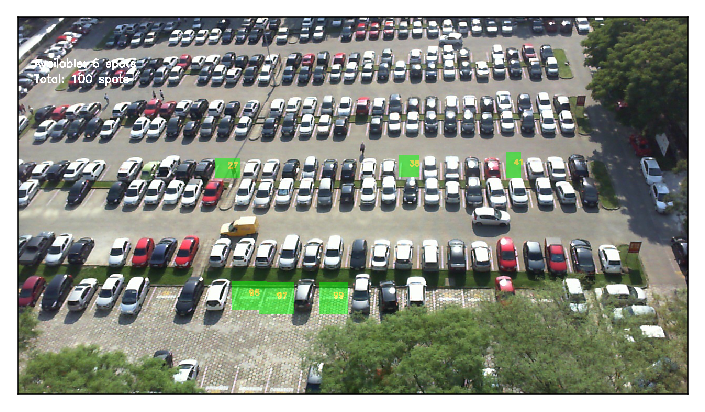

Empty Parking Spots: ['99', '97', '27', '41', '96', '36']


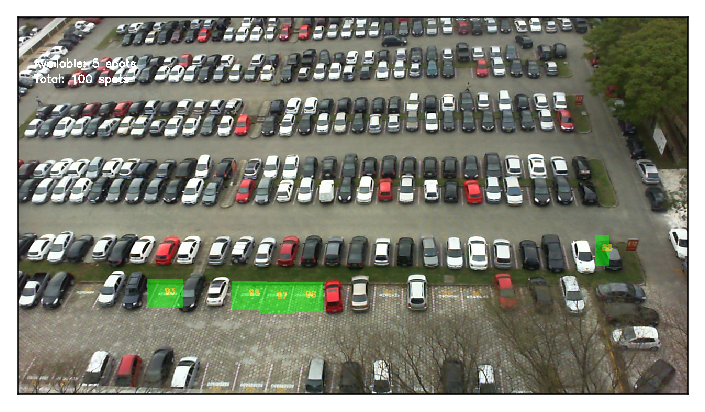

Empty Parking Spots: ['97', '88', '98', '93', '96']


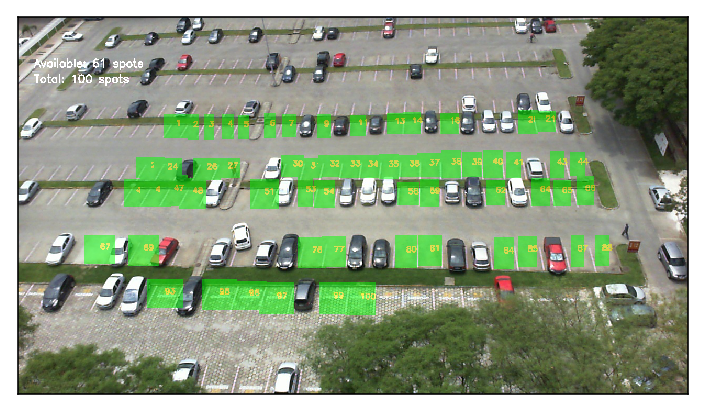

Empty Parking Spots: ['20', '44', '45', '40', '85', '5', '99', '11', '69', '80', '6', '59', '66', '4', '31', '65', '21', '51', '100', '97', '88', '27', '35', '54', '34', '23', '37', '24', '41', '16', '43', '3', '58', '93', '38', '7', '14', '76', '30', '53', '32', '26', '62', '2', '48', '87', '67', '96', '33', '81', '1', '95', '36', '39', '77', '9', '46', '84', '13', '47', '64']


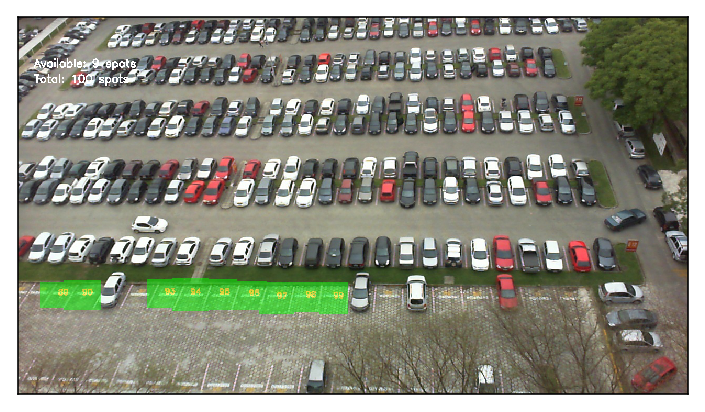

Empty Parking Spots: ['90', '99', '94', '97', '98', '93', '89', '96', '95']


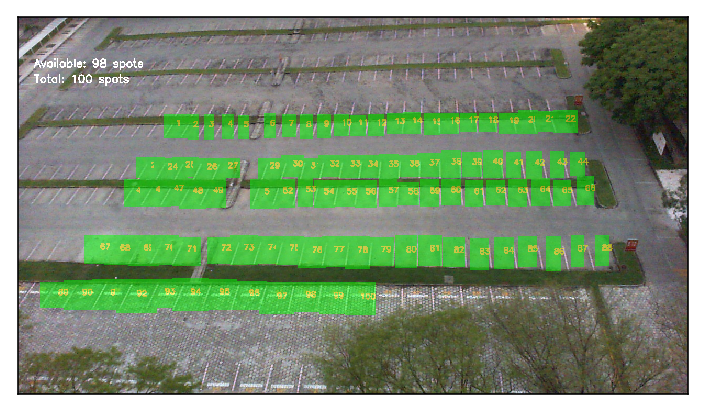

Empty Parking Spots: ['20', '44', '45', '91', '74', '49', '40', '90', '56', '85', '5', '78', '8', '99', '11', '69', '80', '6', '42', '70', '19', '59', '94', '66', '4', '31', '79', '65', '21', '51', '15', '100', '73', '97', '88', '25', '27', '83', '17', '35', '92', '54', '75', '82', '34', '23', '52', '61', '37', '29', '98', '24', '41', '18', '16', '43', '3', '58', '93', '38', '68', '7', '14', '89', '76', '30', '12', '53', '32', '26', '62', '63', '2', '10', '48', '57', '55', '87', '86', '67', '96', '33', '81', '1', '22', '72', '95', '36', '39', '71', '77', '9', '46', '60', '84', '13', '47', '64']


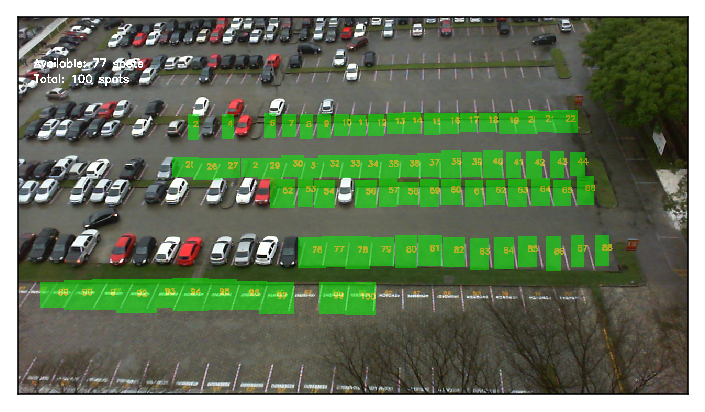

Empty Parking Spots: ['20', '44', '91', '28', '40', '90', '56', '85', '78', '8', '99', '11', '80', '6', '42', '19', '59', '94', '66', '4', '31', '79', '65', '21', '15', '100', '97', '88', '25', '27', '83', '17', '35', '92', '54', '82', '34', '52', '61', '37', '29', '41', '18', '16', '43', '58', '93', '38', '7', '14', '89', '76', '30', '12', '53', '32', '26', '62', '63', '2', '10', '57', '87', '86', '96', '33', '81', '22', '95', '36', '39', '77', '9', '60', '84', '13', '64']


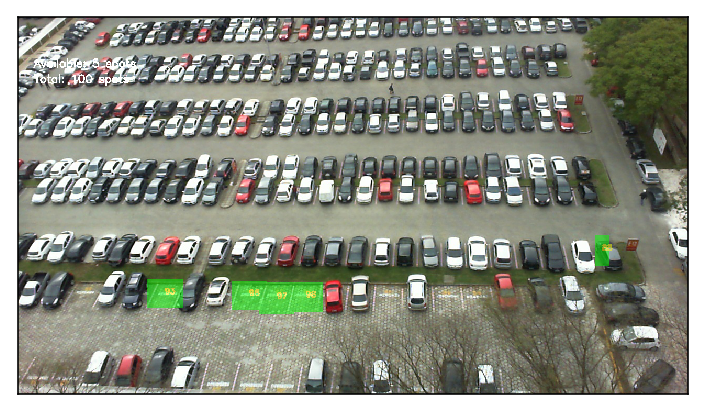

Empty Parking Spots: ['97', '88', '98', '93', '96']


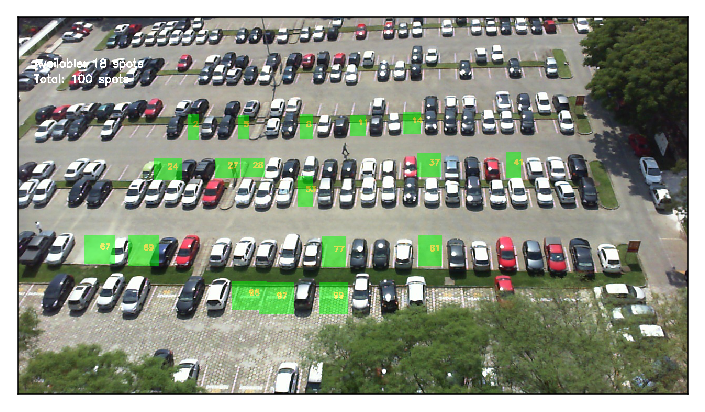

Empty Parking Spots: ['28', '5', '8', '99', '11', '69', '97', '27', '37', '24', '41', '14', '53', '2', '67', '96', '81', '77']


In [12]:
def predict_on_image(image, spot_dict = final_spot_dict, make_copy=True, color = [0, 255, 0], alpha=0.5):
    
    #plt.imshow(image)
    data2=np.zeros(100)
    data2=list()
    if make_copy:
        new_image = np.copy(image)
        overlay = np.copy(image)
    cnt_empty = 0
    all_spots = 0
    
    for spot in spot_dict.keys():
        all_spots += 1
        x1, y1, x2, y2 = spot
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        #crop this image
        if y1>y2:
            spot_img = image[y2:y1, x1:x2]
        else:
            spot_img = image[y1:y2, x1:x2]
            
        spot_img = cv2.resize(spot_img, (48, 48))
        
        label = make_prediction(spot_img)
#         print(label)
        if label == 'empty':
            cv2.rectangle(overlay, (int(x1),int(y1)), (int(x2),int(y2)), color, -1)
            cnt_empty += 1
            
            data = str(spot_dict[spot])
            if(y1<y2):
                    cv2.putText(overlay, data, (int((abs(x2-x1))/2)+x1,int((abs(y2-y1))/2)+y1),
                    cv2.FONT_HERSHEY_SIMPLEX,0.5, (255,255,0), 2)
            else:
                cv2.putText(overlay, data, (int((abs(x2-x1))/2)+x1,int((abs(y2-y1))/2)+y2),
                cv2.FONT_HERSHEY_SIMPLEX,0.5, (255,255,0), 2)
            #print(str(data) + " ", end = " ")
                
            data2.append(data)
            #plt.imshow(image)
   # print(data2)
            
            
    cv2.addWeighted(overlay, alpha, new_image, 1 - alpha, 0, new_image)
            
    cv2.putText(new_image, "Available: %d spots" %cnt_empty, (30, 95),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7, (255, 255, 255), 2)
    
    cv2.putText(new_image, "Total: %d spots" %all_spots, (30, 125),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7, (255, 255, 255), 2)
    save = False
    
    if save:
        filename = 'with_marking.jpg'
        cv2.imwrite(filename, new_image)
    plt.imshow(new_image)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    

    print("Empty Parking Spots:",data2)
    return 0

p = list(map(predict_on_image, parking_lot))

